In [13]:
import pandas as pd
import seaborn as sns
import jsonlines

In [14]:
def add_rolling_mean(df, columns, window, groupby, sortby):
    rolling = df.sort_values(sortby).groupby(groupby)[columns].rolling(window=window).mean()
    rolling.index = rolling.index.droplevel(level=0)
    rolling_columns = [f'{c}_rolling' for c in columns]
    df[rolling_columns] = rolling
    return df

In [27]:
# df = pd.read_parquet('../runs/heuristic_tabular/heuristic_only/metrics.parquet')
final_df = pd.read_parquet(
    '~/cluster/repros/ai_vs_ci/runs/heuristic_tabular/tabular_vs_heuristic_1/agg/final.parquet')
trace_df = pd.read_parquet(
    '~/cluster/repros/ai_vs_ci/runs/heuristic_tabular/tabular_vs_heuristic_1/agg/trace.parquet')

In [16]:
final_df.head(2)

,label.batch,label.controller_args,label.eps,label.networktype,label.project,label.rewards,_step,episode,mode,episode_step,ai_reward,sum_ci_reward,std_ci_reward,avg_coordination,avg_catch
0,tabular_vs_heuristic_1,settings1,decay,cycle64,ai_vs_ci,individual,0,0,train,50,112.0,46.0,4.033195,7.666666,26.333334
1,tabular_vs_heuristic_1,settings1,decay,cycle64,ai_vs_ci,individual,0,0,eval,50,67.0,51.0,6.595453,8.500000,19.666666


In [17]:
len(final_df)

1056000

In [18]:
final_df.columns

Index(['label.batch', 'label.controller_args', 'label.eps',
       'label.networktype', 'label.project', 'label.rewards', '_step',
       'episode', 'mode', 'episode_step', 'ai_reward', 'sum_ci_reward',
       'std_ci_reward', 'avg_coordination', 'avg_catch'],
      dtype='object')

In [19]:
label_columns = [l for l in final_df.columns if 'label' in l]
label_columns

['label.batch',
 'label.controller_args',
 'label.eps',
 'label.networktype',
 'label.project',
 'label.rewards']

In [20]:
for l in label_columns:
    print(l, final_df[l].unique())

label.batch [tabular_vs_heuristic_1]
Categories (1, object): [tabular_vs_heuristic_1]
label.controller_args ['settings1' 'settings5' 'settings3' 'settings6' 'settings2' 'settings4']
label.eps ['decay' 'fixed0.10' 'fixed0.20' 'fixed0.05']
label.networktype ['cycle64' 'full3' 'reg10_4_4' 'full2' 'cycle62' 'full5']
label.project [ai_vs_ci]
Categories (1, object): [ai_vs_ci]
label.rewards ['individual' 'mixed' 'mixed_zero_sum' 'collective']


In [21]:
controller_args_order = ['settings1', 'settings2', 'settings3', 'settings4', 'settings5', 'settings6']
eps_order = ['fixed0.05', 'fixed0.10', 'fixed0.20', 'decay']
networktype_order = ['full2', 'full3', 'full5', 'cycle62', 'cycle64', 'reg10_4_4']
rewards_order = ['individual',  'collective', 'mixed', 'mixed_zero_sum']

In [22]:
metric_columns = ['ai_reward', 'sum_ci_reward', 'std_ci_reward', 'avg_coordination',
       'avg_catch']

In [23]:
columns = metric_columns
window = 50
groupby = label_columns + ['mode']
sortby = 'episode'

In [25]:
final_smooth_df = final_df.groupby(groupby).rolling(on=sortby, window=window)[columns].mean().reset_index()

In [28]:
agg_trace_df = trace_df.groupby(label_columns + ['mode', 'episode_step'])[columns].mean().reset_index()


trace_df['episode_bin'] = pd.cut(trace_df['episode'], bins=10).cat.codes

binned_trace_df = trace_df.groupby(label_columns + ['mode', 'episode_step', 'episode_bin'])[columns].mean().reset_index()

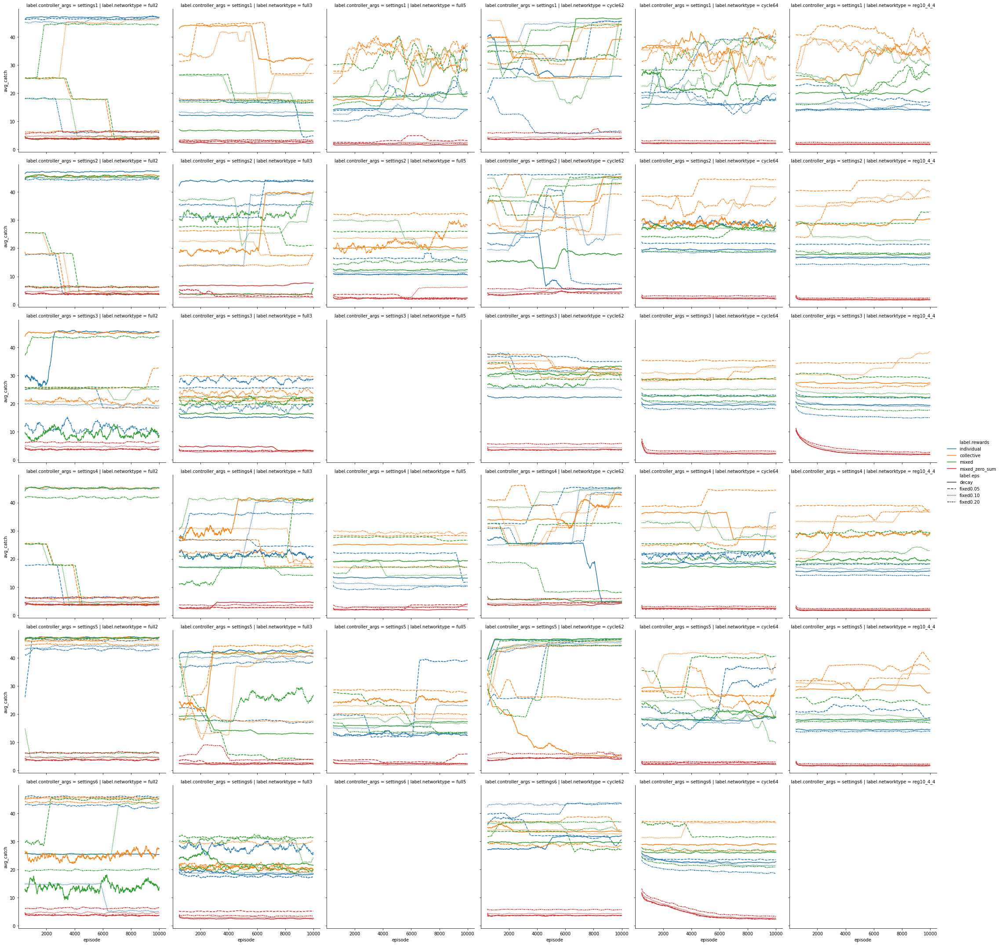

In [34]:
# w = (final_smooth_df['label.eps'] == 'decay')

sns.relplot(
    data=final_smooth_df, x='episode', y='avg_catch', row='label.controller_args', col="label.networktype", hue="label.rewards", kind="line", style='label.eps',row_order=controller_args_order, col_order=networktype_order, hue_order=rewards_order, ci=None)

In [41]:
final_smooth_melt_df = final_smooth_df.melt(id_vars=label_columns + ['mode', 'episode'], value_vars=metric_columns)

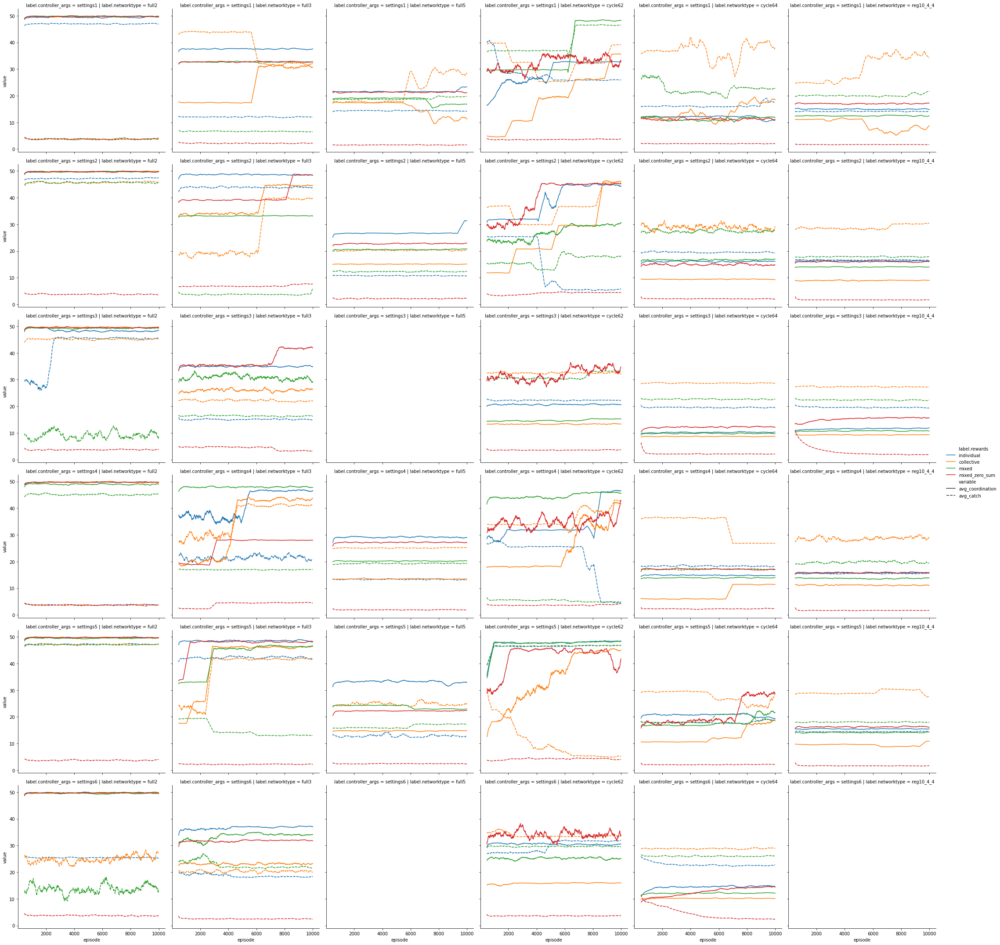

In [45]:
w = ((final_smooth_melt_df['label.eps'] == 'decay') & final_smooth_melt_df['variable'].isin(['avg_catch' , 'avg_coordination']))

sns.relplot(
    data=final_smooth_melt_df[w], x='episode', y='value', row='label.controller_args', col="label.networktype", hue="label.rewards", kind="line", style='variable',row_order=controller_args_order, col_order=networktype_order, hue_order=rewards_order, ci=None)

to be done: individual agent rewards